In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ta.momentum import RSIIndicator
from ta.trend import MACD, SMAIndicator
from ta.volatility import BollingerBands
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import datetime

In [47]:
# Project time frame
start_date = "2020-01-01"
end_date = "2025-05-01"

# Benchmark index
benchmark_symbol = "^GSPC"

# Top 10 symbols from each sector (replace with your actual tickers if needed)
sectors = {
    # "Technology": ["AAPL"],
    "Choosen": ['AAPL', 'MSFT', 'AMZN', 'NFLX', 'MRNA', 'JNJ', 'ILMN', 'NEE', 'TSLA', 'FSLR'],
    "Benchmark": [benchmark_symbol]
}

# Flatten list of all tickers
all_symbols = [symbol for group in sectors.values() for symbol in group]

### Load from CSV

In [48]:
# Load dataset from CSV
import os

if os.path.exists("stock_sector_data.csv"):
    stock_df = pd.read_csv("stock_sector_data.csv", parse_dates=["Date"])
    print("Loaded dataset from CSV.")
else:
    print("CSV file not found. Please run the download step.")
    
# Drop any rows that are not in sectors dictionary
stock_df = stock_df[stock_df["Symbol"].isin(all_symbols)]
    

# Drop any rows with symbol that match the benchmark symbol
# stock_df = stock_df[stock_df["Symbol"] != benchmark_symbol]


Loaded dataset from CSV.


### Feature Engineering — Add Technical Indicators


In [49]:
def add_technical_indicators(df):
    result = []

    for symbol in df["Symbol"].unique():
        sub = df[df["Symbol"] == symbol].sort_values("Date").copy()

        sub["Return_4w"] = sub["Close"].pct_change(4*7)

        # Volatility: Rolling std dev
        sub["Volatility_4w"] = sub["Close"].rolling(window=4*7).std()
        
        # Moving averages
        sub['MA50'] = sub['Close'].rolling(window=50*7).mean()
        
        # Volume indicators
        sub['Volume_Change'] = sub['Volume'].pct_change(periods=7)
        sub['Volume_MA5'] = sub['Volume'].rolling(window=5*7).mean()
        
        # MACD
        sub["MACD"] = MACD(close=sub["Close"]).macd()
        sub["MACD_Signal"] = MACD(close=sub["Close"]).macd_signal()

        # RSI
        sub["RSI"] = RSIIndicator(close=sub["Close"], window=14).rsi()

        # SMAbenchmark_symbol
        # Bollinger Bands
        bb = BollingerBands(close=sub["Close"], window=20)
        sub["BB_Upper"] = bb.bollinger_hband()
        sub["BB_Lower"] = bb.bollinger_lband()

        result.append(sub)

    features_df = pd.concat(result).reset_index(drop=True)
    features_df.drop(columns=["Low", "High", "Open"], inplace=True)
    return features_df
indicator_with_feature = add_technical_indicators(stock_df[stock_df["Symbol"] == benchmark_symbol])
features_df = add_technical_indicators(stock_df[stock_df["Symbol"] != benchmark_symbol])
features_df = features_df.dropna()
features_df.head()

,Date,Close,Volume,Symbol,Sector,Return_4w,Volatility_4w,MA50,Volume_Change,Volume_MA5,MACD,MACD_Signal,RSI,BB_Upper,BB_Lower
349,2016-05-23,22.039343,152074400.0,AAPL,Choosen,-0.134085,1.465270,25.737764,-0.501818,1.716042e+08,-0.475991,-0.639397,48.824621,22.754475,20.281845
350,2016-05-24,22.375320,140560800.0,AAPL,Choosen,-0.121355,1.332161,25.732297,-0.208426,1.725826e+08,-0.379655,-0.587449,53.500443,22.289014,20.614323
351,2016-05-25,22.768429,152675200.0,AAPL,Choosen,-0.087606,1.227005,25.729909,-0.376936,1.739272e+08,-0.268493,-0.523657,58.301174,22.441463,20.516543
352,2016-05-26,22.948984,225324800.0,AAPL,Choosen,-0.060092,1.156410,25.728030,0.200659,1.767305e+08,-0.163937,-0.451713,60.327151,22.706008,20.392647
353,2016-05-27,22.935270,145364800.0,AAPL,Choosen,-0.055645,1.088316,25.725166,-0.136017,1.781887e+08,-0.081245,-0.377620,60.088351,22.928351,20.334343


### Create Outperformance Label

In [50]:
def create_outperformance_labels(features_df, benchmark_df, indicator_with_feature):
    # list all features from the features_df
    feature_columns = features_df.columns.tolist()
    print("Feature columns:", feature_columns)
    print("Benchmark columns:", indicator_with_feature.columns.tolist())
    
    for feature in feature_columns:
        if feature not in ["Date", "Symbol", "Benchmark_Return_Next", "Benchmark_Return"] and features_df[feature].dtype != 'object':
            if feature in indicator_with_feature.columns:
                features_df[f"{feature}_Pct_Difference"] = (features_df[feature] - indicator_with_feature[feature].shift(1)) / indicator_with_feature[feature].shift(1)
            else:
                print(f"Warning: Feature '{feature}' not found in indicator_with_feature. Skipping.")
    
    # Calculate future return for S&P 500
    benchmark_df["Benchmark_Return_Next"] = benchmark_df["Close"].pct_change().shift(-7)

    # Ensure 'Date' columns are of the same type
    features_df["Date"] = pd.to_datetime(features_df["Date"])
    benchmark_df["Date"] = pd.to_datetime(benchmark_df["Date"])

    # Merge benchmark return into stock data
    df = features_df.merge(benchmark_df[["Date", "Benchmark_Return_Next"]], on="Date", how="left")
    
    # Calculate benchmark return this week
    df["Benchmark_Return"] = df["Benchmark_Return_Next"].shift(7)

    # Calculate stock return this week and next week
    price_col = "Adj Close" if "Adj Close" in df.columns else "Close"
    df["Stock_Return_Next"] = df.groupby("Symbol")[price_col].pct_change().shift(-7)
    df["Stock_Return"] = df["Stock_Return_Next"].shift(7)
    
    df.dropna(inplace=True)

    # Label = 1 if stock outperforms benchmark, else 0
    df["Label"] = (df["Stock_Return_Next"] > df["Benchmark_Return_Next"]).astype(int)
    
    

    return df

# Load benchmark data from CSV
benchmark_df = pd.read_csv("stock_sector_data.csv", usecols=["Date", "Symbol", "Close"])
benchmark_df = benchmark_df[benchmark_df["Symbol"] == benchmark_symbol].reset_index(drop=True)

labeled_df = create_outperformance_labels(features_df, benchmark_df, indicator_with_feature)
labeled_df.tail()


Feature columns: ['Date', 'Close', 'Volume', 'Symbol', 'Sector', 'Return_4w', 'Volatility_4w', 'MA50', 'Volume_Change', 'Volume_MA5', 'MACD', 'MACD_Signal', 'RSI', 'BB_Upper', 'BB_Lower']
Benchmark columns: ['Date', 'Close', 'Volume', 'Symbol', 'Sector', 'Return_4w', 'Volatility_4w', 'MA50', 'Volume_Change', 'Volume_MA5', 'MACD', 'MACD_Signal', 'RSI', 'BB_Upper', 'BB_Lower']


,Date,Close,Volume,Symbol,Sector,Return_4w,Volatility_4w,MA50,Volume_Change,Volume_MA5,...,MACD_Pct_Difference,MACD_Signal_Pct_Difference,RSI_Pct_Difference,BB_Upper_Pct_Difference,BB_Lower_Pct_Difference,Benchmark_Return_Next,Benchmark_Return,Stock_Return_Next,Stock_Return,Label
2236,2025-04-14,202.254776,101352900.0,AAPL,Choosen,-0.140918,15.595357,209.159746,-0.019978,6.810607e+07,...,-0.937862,-0.935403,0.033164,-0.960125,-0.964746,0.020259,0.007945,0.018426,0.022054,0
2237,2025-04-15,201.875275,51343900.0,AAPL,Choosen,-0.141036,15.047657,209.193509,-0.592220,6.820123e+07,...,-0.937705,-0.935871,-0.006772,-0.960090,-0.964793,0.007373,-0.001728,0.004367,-0.001876,0
2238,2025-04-16,194.015579,59732400.0,AAPL,Choosen,-0.187393,14.352812,209.207114,-0.627757,6.863834e+07,...,-0.932755,-0.935282,-0.086279,-0.960124,-0.965006,0.000641,-0.022408,0.004109,-0.038933,1
2239,2025-04-17,196.722031,51334300.0,AAPL,Choosen,-0.134078,14.109222,209.226550,-0.575256,6.892921e+07,...,-0.935688,-0.935359,0.041964,-0.960122,-0.965052,0.005802,0.001327,0.005092,0.013950,0
2240,2025-04-21,192.907028,46742500.0,AAPL,Choosen,-0.125340,14.189746,209.238888,-0.746510,6.864090e+07,...,-0.935161,-0.935322,-0.012109,-0.960200,-0.965177,0.001480,-0.023567,0.006108,-0.019393,1


### Train/Test Split & Preprocessing

In [51]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

def preprocess_data(df):
    # Drop rows where the label is missing (NaN due to shifting)
    df = df.dropna(subset=["Label"])
    
    # Fill remaining missing values with median (safe for numeric features)
    df = df.fillna(df.median(numeric_only=True))

    # Keep only numeric feature columns
    # exclude_cols = ['Date', 'Symbol', 'Sector', 'Label', 'Stock_Return_Next', 'Benchmark_Return_Next']
    exclude_cols = ['Date', 'Sector', 'Label', 'Stock_Return_Next', 'Benchmark_Return_Next']
    feature_columns = [col for col in df.columns if col not in exclude_cols and df[col].dtype != 'object']
    
    X = df[feature_columns]
    y = df["Label"].astype(int)  # Ensure label is int

    # Optional: Scaling (not strictly necessary for Random Forest)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    return X_scaled, y

In [7]:
# Split the data: train up to 2023, test after
# train_data = labeled_df[labeled_df["Date"] < "2024-11-01"]
# test_data = labeled_df[labeled_df["Date"] >= "2024-11-01"]
train_data, test_data = train_test_split(labeled_df, test_size=0.2, random_state=42, stratify=labeled_df["Label"])

X_train, y_train = preprocess_data(train_data)
X_test, y_test = preprocess_data(test_data)

In [8]:
# Shape of the data
print(f"Training data shape: {X_train.shape}, Labels shape: {y_train.shape}")
print(f"Testing data shape: {X_test.shape}, Labels shape: {y_test.shape}")

Training data shape: (1787, 26), Labels shape: (1787,)
Testing data shape: (447, 26), Labels shape: (447,)


### Train Random KMeans

In [9]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import f1_score

# Train K-Means
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_train)

# Predict cluster labels
y_pred = kmeans.predict(X_test)
    
# Evaluation: Metrics
print("Cluster Centers:")
print(kmeans.cluster_centers_)

print("Silhouette Score:")
print(silhouette_score(X_test, y_pred))  

print(classification_report(y_test, y_pred))




Cluster Centers:
[[ 0.91006963 -0.51670193 -0.13453746  0.67599463  0.92313069 -0.01029082
  -0.74216606  0.02291099  0.03530459 -0.20405048  0.90947541  0.91356816
   0.90680714 -0.62322403 -0.00859991  0.43113307  0.95703648 -0.00237541
  -0.88755096 -0.00827005  0.02926381 -0.14366926  0.9091405   0.91552096
  -0.01835231 -0.03520089]
 [-0.88297825  0.50132051  0.13053249 -0.65587131 -0.8956505   0.00998447
   0.72007291 -0.02222896 -0.03425363  0.19797621 -0.88240172 -0.88637263
  -0.87981288  0.60467161  0.0083439  -0.4182989  -0.92854697  0.0023047
   0.86112993  0.00802386 -0.02839267  0.13939245 -0.88207678 -0.8882673
   0.01780599  0.03415301]]
Silhouette Score:
0.36894779398149996
              precision    recall  f1-score   support

           0       0.50      0.55      0.53       214
           1       0.55      0.50      0.52       233

    accuracy                           0.53       447
   macro avg       0.53      0.53      0.53       447
weighted avg       0.53     

In [10]:
from sklearn.metrics import roc_auc_score

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred)

print(f"ROC AUC Score: {roc_auc:.4f}")

ROC AUC Score: 0.5268


### Feature Importance Plot

In [11]:

from kmeans_interp.kmeans_feature_imp import KMeansInterp

exclude_cols = ['Date', 'Sector', 'Label', 'Stock_Return_Next', 'Benchmark_Return_Next']

# Get feature importances and namesX_train
feature_columns = [col for col in train_data.columns if col not in exclude_cols and train_data[col].dtype != 'object']

kms = KMeansInterp(
	n_clusters=2,
	ordered_feature_names=feature_columns, 
	feature_importance_method='wcss_min', # or 'unsup2sup'
).fit(train_data[feature_columns].values)

kms.feature_importances_[0]

[('Volume', np.float64(165019479.9614643)),
 ('Volume_MA5', np.float64(144060235.84365538)),
 ('BB_Upper', np.float64(66.69232714888625)),
 ('Close', np.float64(62.33666017932928)),
 ('BB_Lower', np.float64(57.28650598828786)),
 ('RSI', np.float64(54.11637329222604)),
 ('MA50', np.float64(49.67088066305827)),
 ('Volume_Change_Pct_Difference', np.float64(2.8437295163267007)),
 ('Volatility_4w', np.float64(2.8313418474627086)),
 ('MA50_Pct_Difference', np.float64(0.982630037754764)),
 ('BB_Lower_Pct_Difference', np.float64(0.9804845548510263)),
 ('Close_Pct_Difference', np.float64(0.9796367480183541)),
 ('BB_Upper_Pct_Difference', np.float64(0.9791484241387852)),
 ('MACD_Signal_Pct_Difference', np.float64(0.9700750027652288)),
 ('Volume_MA5_Pct_Difference', np.float64(0.9644707412262146)),
 ('Volume_Pct_Difference', np.float64(0.9596517905815474)),
 ('MACD_Pct_Difference', np.float64(0.9586113058066055)),
 ('Volatility_4w_Pct_Difference', np.float64(0.9544895936758924)),
 ('MACD_Signal',

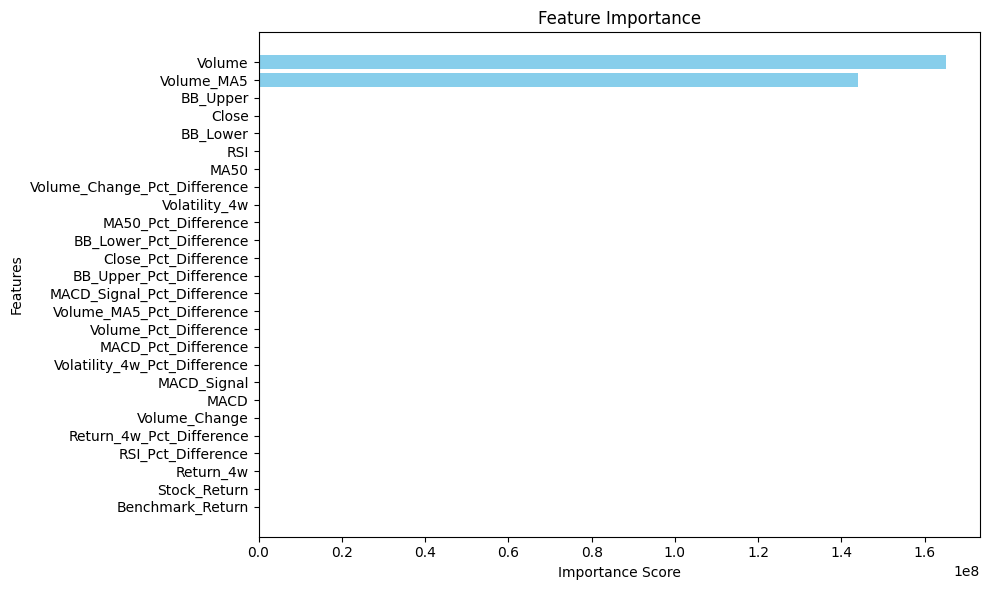

In [12]:
import matplotlib.pyplot as plt

# Extract feature names and their importance scores
feature_names = [feature[0] for feature in kms.feature_importances_[0]]
importance_scores = [feature[1] for feature in kms.feature_importances_[0]]

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_names, importance_scores, color='skyblue')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.title('Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature at the top
plt.tight_layout()
plt.show()

In [13]:
top_10_features = [feature[0] for feature in kms.feature_importances_[0][:10]]
top_10_features

['Volume',
 'Volume_MA5',
 'BB_Upper',
 'Close',
 'BB_Lower',
 'RSI',
 'MA50',
 'Volume_Change_Pct_Difference',
 'Volatility_4w',
 'MA50_Pct_Difference']

### Correlation Analysis

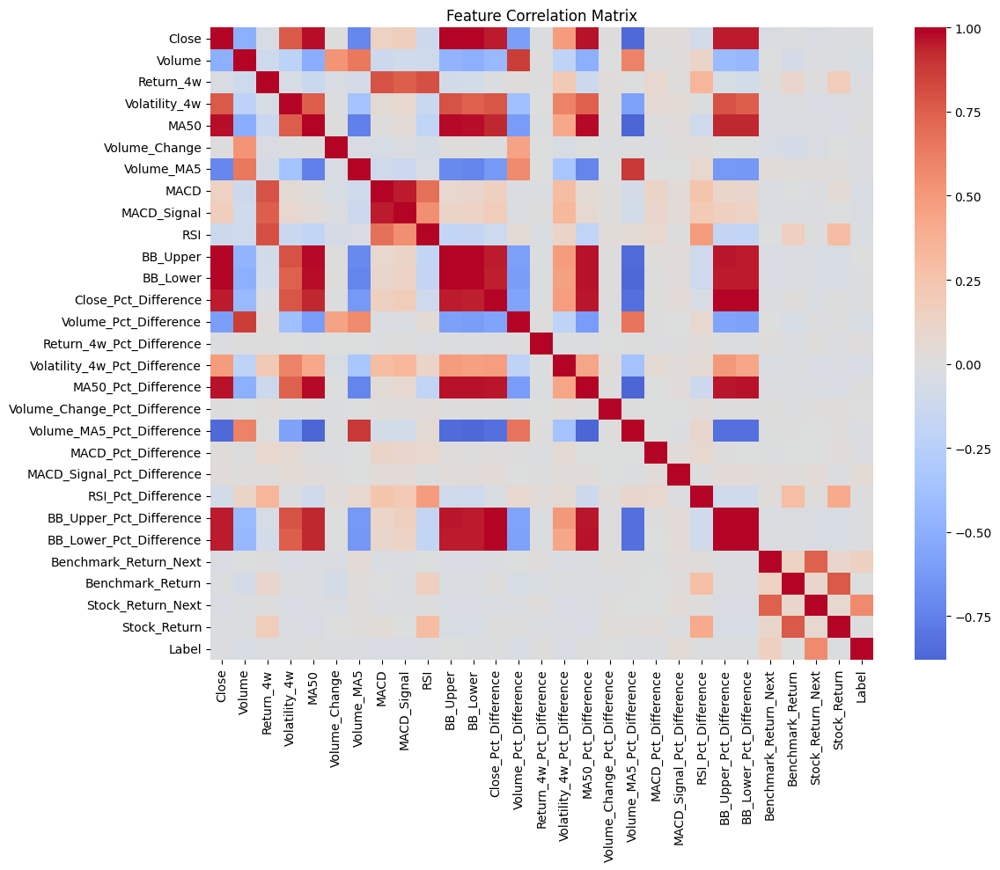

In [14]:
# Compute correlation matrix on the training features
exclude_cols = ['Date', 'Symbol', 'Sector']

numeric_cols = [col for col in train_data.columns if col not in exclude_cols and train_data[col].dtype != 'object']
corr_matrix = train_data[numeric_cols].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', center=0)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()

In [15]:
exclude_cols = ['Date', 'Sector', 'Stock_Return_Next', 'Benchmark_Return_Next', 'Label', 'Symbol']

# Drop excluded columns from correlation series
filtered_corr = corr_matrix["Label"].drop(labels=exclude_cols, errors='ignore')

# Get top 10 features
top_10_corr = filtered_corr.abs().nlargest(10)
print("Top 10 correlated features with the label:")

print(top_10_corr)


Top 10 correlated features with the label:
Volume_Pct_Difference           0.043726
MACD_Signal_Pct_Difference      0.038262
Volume                          0.036204
MACD                            0.034866
MACD_Signal                     0.032773
Volatility_4w_Pct_Difference    0.030038
RSI                             0.025891
Volume_MA5                      0.017672
Volume_MA5_Pct_Difference       0.017223
Volume_Change                   0.015155
Name: Label, dtype: float64


In [16]:
# list groups of similar features
# Group similar features based on their correlation
threshold = 0.8  # Define a correlation threshold for grouping
groups = []

for feature in numeric_cols:
    group = [feature]
    for other_feature in numeric_cols:
        if feature != other_feature and abs(corr_matrix.loc[feature, other_feature]) > threshold:
            group.append(other_feature)
    group = sorted(set(group))  # Ensure unique and sorted
    if group not in groups:
        groups.append(group)

# Display the groups
for i, group in enumerate(groups, 1):
    print(f"Group {i}: {group}")

Group 1: ['BB_Lower', 'BB_Lower_Pct_Difference', 'BB_Upper', 'BB_Upper_Pct_Difference', 'Close', 'Close_Pct_Difference', 'MA50', 'MA50_Pct_Difference', 'Volume_MA5_Pct_Difference']
Group 2: ['Volume', 'Volume_Pct_Difference']
Group 3: ['RSI', 'Return_4w']
Group 4: ['Volatility_4w']
Group 5: ['Volume_Change']
Group 6: ['Volume_MA5', 'Volume_MA5_Pct_Difference']
Group 7: ['MACD', 'MACD_Signal']
Group 8: ['Return_4w_Pct_Difference']
Group 9: ['Volatility_4w_Pct_Difference']
Group 10: ['Volume_Change_Pct_Difference']
Group 11: ['BB_Lower', 'BB_Lower_Pct_Difference', 'BB_Upper', 'BB_Upper_Pct_Difference', 'Close', 'Close_Pct_Difference', 'MA50', 'MA50_Pct_Difference', 'Volume_MA5', 'Volume_MA5_Pct_Difference']
Group 12: ['MACD_Pct_Difference']
Group 13: ['MACD_Signal_Pct_Difference']
Group 14: ['RSI_Pct_Difference']
Group 15: ['Benchmark_Return_Next']
Group 16: ['Benchmark_Return']
Group 17: ['Stock_Return_Next']
Group 18: ['Stock_Return']
Group 19: ['Label']


### Reduce Multicollinearity

In [17]:
selected_features = top_10_features
print("Selected features:", selected_features)

Selected features: ['Volume', 'Volume_MA5', 'BB_Upper', 'Close', 'BB_Lower', 'RSI', 'MA50', 'Volume_Change_Pct_Difference', 'Volatility_4w', 'MA50_Pct_Difference']


### Train/Test Split & Preprocessing after Reduce Multicollinearity

In [18]:
from itertools import combinations
from sklearn.metrics import silhouette_score
from joblib import Parallel, delayed
import time

import matplotlib.pyplot as plt

# Store the best combination and its score
best_combination = None
best_score = 0
scores = []

# Function to evaluate a combination of features
def evaluate_combination(combo):
    # Preprocess data with the current combination of features
    start_time = time.time()
    X_train_combo = train_data[list(combo)]
    X_test_combo = test_data[list(combo)]

    kmeans = KMeans(n_clusters=2, random_state=42)
    # Train the model
    kmeans.fit(X_train_combo)

    # Predict and evaluate
    y_pred_combo = kmeans.predict(X_test_combo)
    # Check if there are at least two distinct clusters
    if len(set(y_pred_combo)) > 1:
        score = silhouette_score(X_test_combo, y_pred_combo)
        print(f"Combination: {combo}, Silhouette Score: {score}")
    else:
        score = float('-inf')  # Assign a very low score for invalid combinations
        print(f"Combination: {combo}, Silhouette Score: Not valid (only one cluster)")

    print(f"Time taken: {time.time() - start_time:.2f} seconds")

    return combo, score

# Run combinations in parallel
results = Parallel(n_jobs=-1)(
    delayed(evaluate_combination)(combo)
    for r in range(1, len(selected_features) + 1)
    for combo in combinations(selected_features, r)
)


Combination: ('Volume_Change_Pct_Difference',), Silhouette Score: 0.9910411408478107
Time taken: 0.05 seconds
Combination: ('Volume_MA5',), Silhouette Score: 0.5339155076937283
Time taken: 0.07 seconds
Combination: ('Volume', 'Close'), Silhouette Score: 0.6463583013214259
Time taken: 0.02 seconds
Combination: ('Volume', 'BB_Lower'), Silhouette Score: 0.6463583013223664
Time taken: 0.02 secondsCombination: ('Volume', 'RSI'), Silhouette Score: 0.6463583013274573
Time taken: 0.02 seconds

Combination: ('Volume', 'MA50'), Silhouette Score: 0.646358301322531
Time taken: 0.02 seconds
Combination: ('Close',), Silhouette Score: 0.7442159999977234
Time taken: 0.04 seconds
Combination: ('Volume', 'Volume_Change_Pct_Difference'), Silhouette Score: 0.6463583011284039
Time taken: 0.02 seconds
Combination: ('MA50_Pct_Difference',), Silhouette Score: 0.7919366348040509
Time taken: 0.10 seconds
Combination: ('Volume', 'Volatility_4w'), Silhouette Score: 0.6463583013277795
Time taken: 0.03 seconds
Comb

In [19]:
# Collect and rank results
scores = sorted(results, key=lambda x: x[1], reverse=True)
best_combination, best_score = scores[0]

best_combination = np.array(best_combination)

print(f"Best combination: {best_combination}")
print(f"Best F1 Score: {best_score}")

Best combination: ['Volume_Change_Pct_Difference']
Best F1 Score: 0.9910411408478107


In [20]:
results.sort(key=lambda x: x[1], reverse=True)
results

[(('Volume_Change_Pct_Difference',), np.float64(0.9910411408478107)),
 (('Volume_Change_Pct_Difference', 'MA50_Pct_Difference'),
  np.float64(0.9910411048363335)),
 (('Volume_Change_Pct_Difference', 'Volatility_4w'),
  np.float64(0.9905987340614677)),
 (('Volume_Change_Pct_Difference', 'Volatility_4w', 'MA50_Pct_Difference'),
  np.float64(0.9905987282024946)),
 (('RSI', 'Volume_Change_Pct_Difference'), np.float64(0.9878819616478278)),
 (('RSI', 'Volume_Change_Pct_Difference', 'MA50_Pct_Difference'),
  np.float64(0.987881958231597)),
 (('RSI', 'Volume_Change_Pct_Difference', 'Volatility_4w'),
  np.float64(0.9876960038827597)),
 (('RSI',
   'Volume_Change_Pct_Difference',
   'Volatility_4w',
   'MA50_Pct_Difference'),
  np.float64(0.9876960013828378)),
 (('MA50_Pct_Difference',), np.float64(0.7919366348040509)),
 (('MA50',), np.float64(0.7690823950271831)),
 (('MA50', 'MA50_Pct_Difference'), np.float64(0.7690823936640665)),
 (('MA50', 'Volatility_4w'), np.float64(0.7668884804416255)),
 (

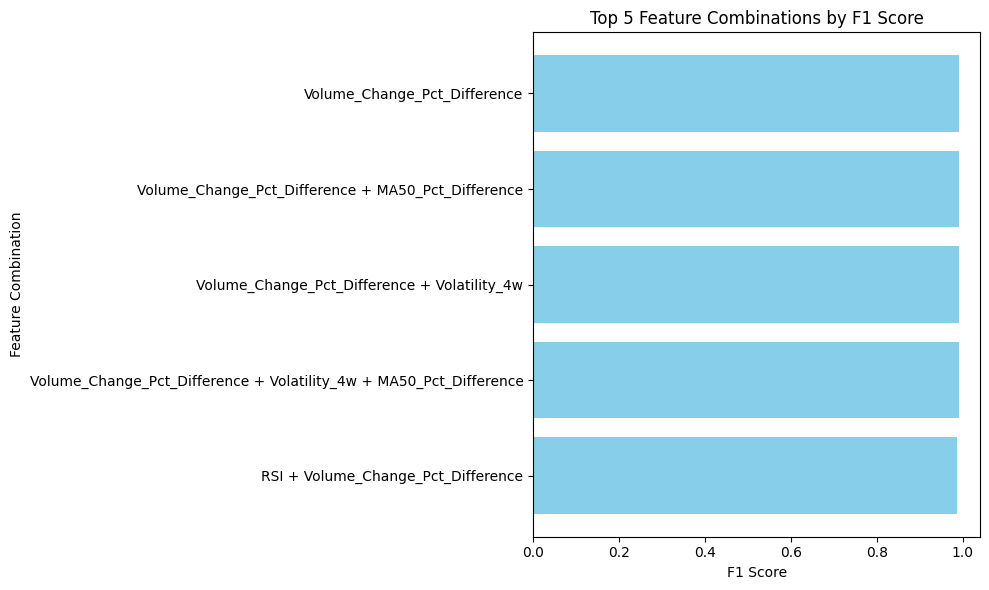

In [21]:
import matplotlib.pyplot as plt

# Extract the top 5 results
top_5_results = sorted(results, key=lambda x: x[1], reverse=True)[:5]
combinations = [' + '.join(combo) for combo, _ in top_5_results]
scores = [score for _, score in top_5_results]

# Plot the results
plt.figure(figsize=(10, 6))
plt.barh(combinations, scores, color='skyblue')
plt.xlabel('F1 Score')
plt.ylabel('Feature Combination')
plt.title('Top 5 Feature Combinations by F1 Score')
plt.gca().invert_yaxis()  # Invert y-axis to show the best score at the top
plt.tight_layout()
plt.show()

### Apply best combination

In [22]:
# Apply the specified hyperparameters and best feature combination
kmeans = KMeans(
    algorithm='lloyd',
    init='k-means++',
    max_iter=100,
    n_clusters=2,
    n_init=5,
    tol=0.0001,
    random_state=42
)

# exclude_cols = ['Date', 'Symbol', 'Sector', 'Label', 'Stock_Return_Next', 'Benchmark_Return_Next', 'Open', 'High', 'Low']
# select_features = [col for col in train_data.columns if col not in exclude_cols and train_data[col].dtype != 'object']

# Use the best combination of features
select_features = best_combination

# Create test and train sets
# train_data = labeled_df[labeled_df["Date"] < "2025-01-01"]
# test_data = labeled_df[labeled_df["Date"] >= "2025-01-01"]
train_data, test_data = train_test_split(labeled_df, test_size=0.2, random_state=42)

In [23]:
print(train_data['Label'].value_counts())
print(test_data['Label'].value_counts())

Label
1    957
0    830
Name: count, dtype: int64
Label
0    241
1    206
Name: count, dtype: int64


In [24]:
# Create a new DataFrame with the selected features
X_train = train_data[select_features]
X_test = test_data[select_features]
y_train = train_data["Label"]
y_test = test_data["Label"]

# Train the model
km_model = kmeans.fit(X_train)

# Make predictions
y_pred = kmeans.predict(X_test)

# Generate classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.54      1.00      0.70       241
           1       0.00      0.00      0.00       206

    accuracy                           0.54       447
   macro avg       0.27      0.50      0.35       447
weighted avg       0.29      0.54      0.38       447



/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

In [25]:

roc_auc = roc_auc_score(y_test, y_pred)

print(f"ROC AUC Score: {roc_auc:.4f}")

ROC AUC Score: 0.5000


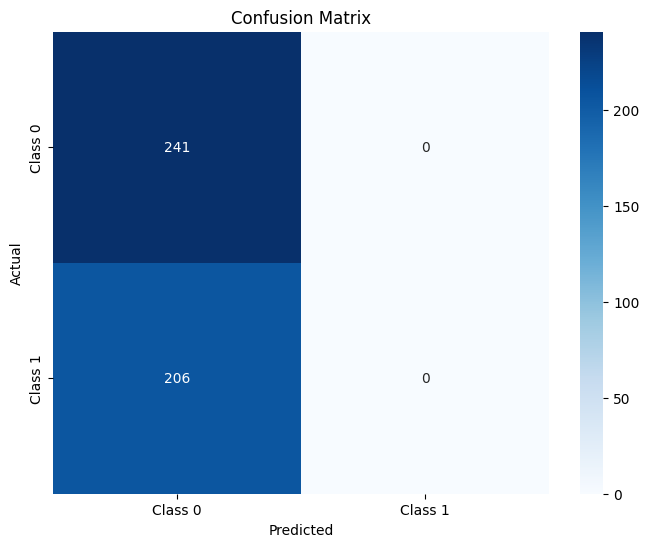

In [26]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

import matplotlib.pyplot as plt

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [27]:
import os
import joblib
from datetime import datetime

# Create a folder to save the model
os.makedirs("models", exist_ok=True)

# Generate a timestamped filename
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
model_filename = f"models/kmeans_model_{timestamp}.joblib"

# Save the model
joblib.dump(km_model, model_filename)
print(f"Model saved to {model_filename}")

Model saved to models/kmeans_model_20250514_012117.joblib


In [28]:
import joblib

# Load the model from the saved file
loaded_model = joblib.load(model_filename)
print(f"Model loaded from {model_filename}")

Model loaded from models/kmeans_model_20250514_012117.joblib


In [29]:
from sklearn.metrics import classification_report

# Use the loaded model to make predictions on the test data
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the predictions
print(classification_report(y_test, y_pred_loaded))

              precision    recall  f1-score   support

           0       0.54      1.00      0.70       241
           1       0.00      0.00      0.00       206

    accuracy                           0.54       447
   macro avg       0.27      0.50      0.35       447
weighted avg       0.29      0.54      0.38       447



/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

### Hyperparameter Tuning

In [30]:
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, silhouette_score

# Define a custom scorer for silhouette score
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    return silhouette_score(X, labels)

param_grid = {
    'n_clusters': range(2, 10),
    'init': ['k-means++', 'random'],
    'n_init': [5, 10, 15],
    'max_iter': [100, 200, 300, 400, 500],
    'tol': [0.0001, 0.001, 0.01],
    'algorithm': ['lloyd', 'elkan'],
    'random_state': [0, 42, 100]
}

grid = GridSearchCV(KMeans(), param_grid, cv=3, scoring=make_scorer(silhouette_scorer), n_jobs=-1)
grid.fit(X_train)



/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 947, in _score
    scores = scorer(estimator, X_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
TypeError: _BaseScorer.__call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/kamin/Documents/CPE 232 Project/.venv/lib/python3.12/site-packages/sklearn/model_selection/

GridSearchCV(cv=3, estimator=KMeans(), n_jobs=-1,
             param_grid={'algorithm': ['lloyd', 'elkan'],
                         'init': ['k-means++', 'random'],
                         'max_iter': [100, 200, 300, 400, 500],
                         'n_clusters': range(2, 10), 'n_init': [5, 10, 15],
                         'random_state': [0, 42, 100],
                         'tol': [0.0001, 0.001, 0.01]},
             scoring=make_scorer(silhouette_scorer, response_method='predict'))

In [31]:
print("Best parameters found: ", grid.best_params_)

Best parameters found:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 100, 'n_clusters': 2, 'n_init': 5, 'random_state': 0, 'tol': 0.0001}


###  Cross-Validation Evaluation

In [32]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(km_model, X_train, y_train, cv=TimeSeriesSplit(n_splits=5), scoring='f1')

# Print the results
print("Cross-Validation F1 Scores:", cv_scores)
print("Mean F1 Score:", np.mean(cv_scores))

Cross-Validation F1 Scores: [0. 0. 0. 0. 0.]
Mean F1 Score: 0.0


### Stock Price Trend (Line Plot)

Available stock symbols:
1. Apple (AAPL)
2. Microsoft (MSFT)
3. Amazon (AMZN)
4. Netflix (NFLX)
5. Moderna (MRNA)
6. Johnson & Johnson (JNJ)
7. Illumina (ILMN)
8. NextEra Energy (NEE)
9. Tesla (TSLA)
10. First Solar (FSLR)
11. S&P 500 (^GSPC)


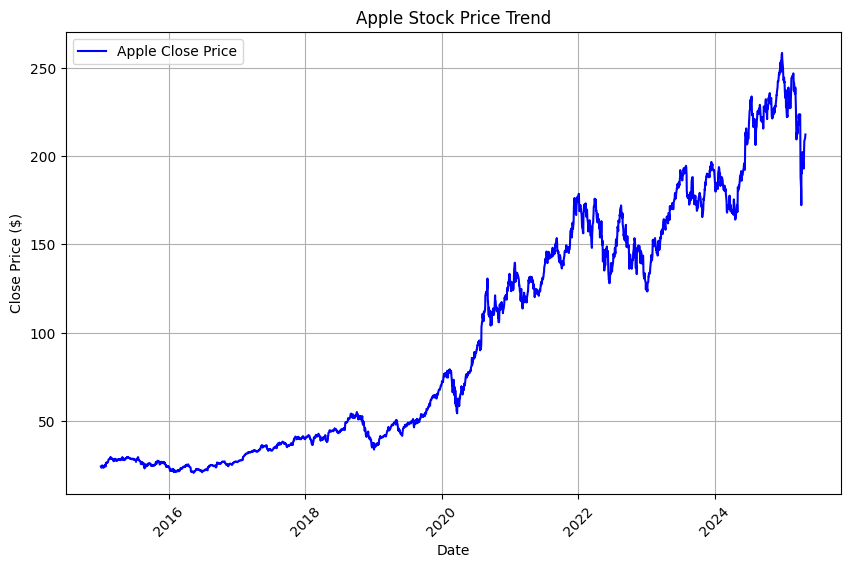

In [33]:
import matplotlib.pyplot as plt
import pandas as pd

# Company name mapping
company_names = {
    'AAPL': 'Apple',
    'MSFT': 'Microsoft',
    'AMZN': 'Amazon',
    'NFLX': 'Netflix',
    'MRNA': 'Moderna',
    'JNJ': 'Johnson & Johnson',
    'ILMN': 'Illumina',
    'NEE': 'NextEra Energy',
    'TSLA': 'Tesla',
    'FSLR': 'First Solar',
    '^GSPC': 'S&P 500'
}

# Load the CSV data
csv_data = pd.read_csv('stock_sector_data.csv')


csv_data['Date'] = pd.to_datetime(csv_data['Date'])

available_symbols = csv_data['Symbol'].unique()

# Display all available company names
print("Available stock symbols:")
for idx, symbol in enumerate(available_symbols, 1):
    print(f"{idx}. {company_names.get(symbol, symbol)} ({symbol})")


choice = int(input(f"Enter the number of the stock you want to analyze (1-{len(available_symbols)}): "))


stock_symbol = available_symbols[choice - 1]
company_name = company_names.get(stock_symbol, stock_symbol)  # Default to symbol if not found

stock_data = csv_data[csv_data['Symbol'] == stock_symbol]

# Plot the closing price over time
plt.figure(figsize=(10, 6))
plt.plot(stock_data['Date'], stock_data['Close'], label=f'{company_name} Close Price', color='b')
plt.xlabel('Date')
plt.ylabel('Close Price ($)')
plt.title(f'{company_name} Stock Price Trend')
plt.grid(True)
plt.legend()
plt.xticks(rotation=45)
plt.show()


### Return Distributions (Histogram/Density Plot)

Available stock symbols:
1. Apple (AAPL)
2. Microsoft (MSFT)
3. Amazon (AMZN)
4. Netflix (NFLX)
5. Moderna (MRNA)
6. Johnson & Johnson (JNJ)
7. Illumina (ILMN)
8. NextEra Energy (NEE)
9. Tesla (TSLA)
10. First Solar (FSLR)
11. S&P 500 (^GSPC)


/tmp/ipykernel_253638/4139713334.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Returns'] = stock_data['Close'].pct_change()


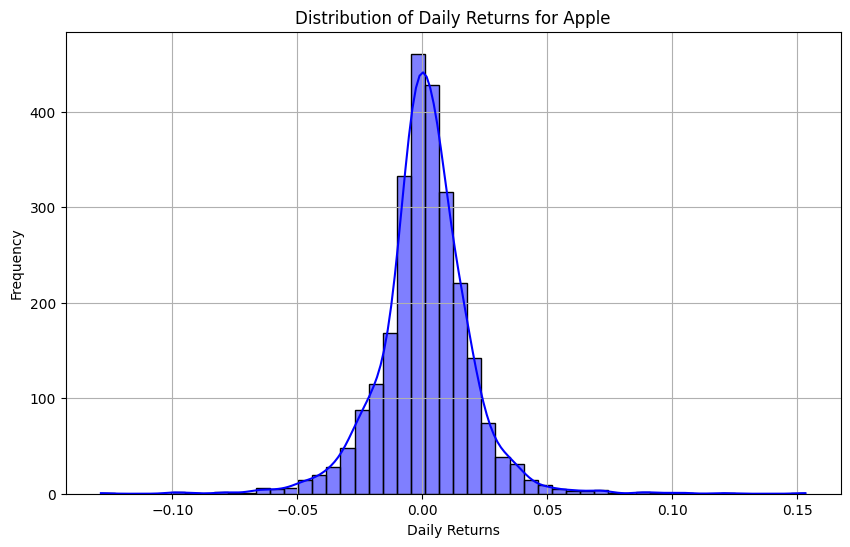

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns



print("Available stock symbols:")
for idx, symbol in enumerate(company_names.keys(), 1):
    print(f"{idx}. {company_names[symbol]} ({symbol})")


choice = int(input(f"Enter the number of the stock you want to analyze (1-{len(company_names)}): "))


stock_symbol = list(company_names.keys())[choice - 1]
company_name = company_names[stock_symbol]

# Load the CSV data
csv_data = pd.read_csv(r'/home/kamin/Documents/CPE 232 Project/stock_sector_data.csv')


csv_data['Date'] = pd.to_datetime(csv_data['Date'])

# Filter data for the chosen stock symbol
stock_data = csv_data[csv_data['Symbol'] == stock_symbol]
stock_data['Returns'] = stock_data['Close'].pct_change()

# Plot the distribution of daily returns
plt.figure(figsize=(10, 6))
sns.histplot(stock_data['Returns'].dropna(), bins=50, kde=True, color='blue')
plt.title(f'Distribution of Daily Returns for {company_name}')
plt.xlabel('Daily Returns')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()




### Stock Volatility (Rolling Standard Deviation)

Available stock symbols:
1. Apple (AAPL)
2. Microsoft (MSFT)
3. Amazon (AMZN)
4. Netflix (NFLX)
5. Moderna (MRNA)
6. Johnson & Johnson (JNJ)
7. Illumina (ILMN)
8. NextEra Energy (NEE)
9. Tesla (TSLA)
10. First Solar (FSLR)
11. S&P 500 (^GSPC)


/tmp/ipykernel_253638/2904839555.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Returns'] = stock_data['Close'].pct_change()
/tmp/ipykernel_253638/2904839555.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Rolling_Volatility'] = stock_data['Returns'].rolling(window=30).std()


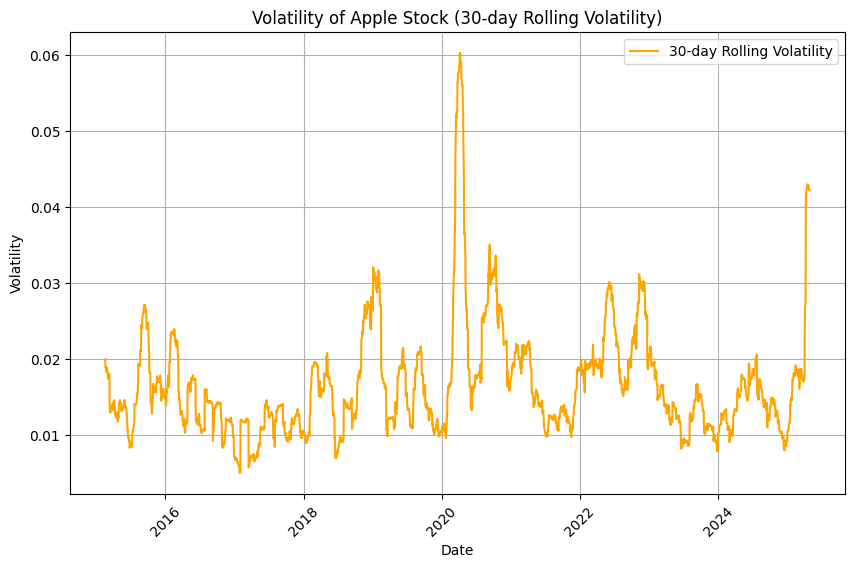

In [35]:
import matplotlib.pyplot as plt
import pandas as pd


print("Available stock symbols:")
for idx, symbol in enumerate(company_names.keys(), 1):
    print(f"{idx}. {company_names[symbol]} ({symbol})")


choice = int(input(f"Enter the number of the stock you want to analyze (1-{len(company_names)}): "))

stock_symbol = list(company_names.keys())[choice - 1]
company_name = company_names[stock_symbol]

# Load the CSV data
csv_data = pd.read_csv(r'/home/kamin/Documents/CPE 232 Project/stock_sector_data.csv')

csv_data['Date'] = pd.to_datetime(csv_data['Date'])

stock_data = csv_data[csv_data['Symbol'] == stock_symbol]

# Calculate daily returns as percentage change in closing price
stock_data['Returns'] = stock_data['Close'].pct_change()

# Calculate rolling 30-day volatility (standard deviation of returns)
stock_data['Rolling_Volatility'] = stock_data['Returns'].rolling(window=30).std()

# Plot the rolling volatility
plt.figure(figsize=(10, 6))
plt.plot(stock_data['Date'], stock_data['Rolling_Volatility'], label='30-day Rolling Volatility', color='orange')
plt.title(f'Volatility of {company_name} Stock (30-day Rolling Volatility)')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.grid(True)
plt.legend()
plt.xticks(rotation=45)  
plt.show()


### Price vs. Volume (Scatter Plot)

Available stock symbols:
1. Apple (AAPL)
2. Microsoft (MSFT)
3. Amazon (AMZN)
4. Netflix (NFLX)
5. Moderna (MRNA)
6. Johnson & Johnson (JNJ)
7. Illumina (ILMN)
8. NextEra Energy (NEE)
9. Tesla (TSLA)
10. First Solar (FSLR)
11. S&P 500 (^GSPC)


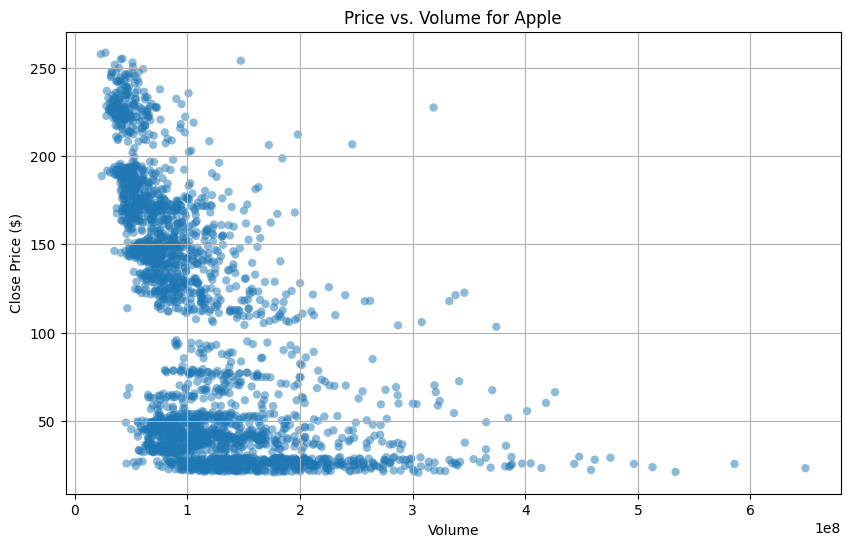

In [36]:
import matplotlib.pyplot as plt
import pandas as pd


print("Available stock symbols:")
for idx, symbol in enumerate(company_names.keys(), 1):
    print(f"{idx}. {company_names[symbol]} ({symbol})")

choice = int(input(f"Enter the number corresponding to the stock symbol you want to analyze (1-{len(company_names)}): "))

stock_symbol = list(company_names.keys())[choice - 1]
company_name = company_names[stock_symbol]

# Load the CSV data
csv_data = pd.read_csv(r'/home/kamin/Documents/CPE 232 Project/stock_sector_data.csv')

csv_data['Date'] = pd.to_datetime(csv_data['Date'])

stock_data = csv_data[csv_data['Symbol'] == stock_symbol]

# Plot Close Price vs. Volume
plt.figure(figsize=(10, 6))
plt.scatter(
    stock_data['Volume'],
    stock_data['Close'],
    alpha=0.5,
    edgecolors='none'
)
plt.title(f'Price vs. Volume for {company_name}')
plt.xlabel('Volume')
plt.ylabel('Close Price ($)')
plt.grid(True)
plt.show()



### Technical Indicators (RSI, MACD, Bollinger Bands)

Available stock symbols:
1. Apple (AAPL)
2. Microsoft (MSFT)
3. Amazon (AMZN)
4. Netflix (NFLX)
5. Moderna (MRNA)
6. Johnson & Johnson (JNJ)
7. Illumina (ILMN)
8. NextEra Energy (NEE)
9. Tesla (TSLA)
10. First Solar (FSLR)
11. S&P 500 (^GSPC)


/tmp/ipykernel_253638/1660732182.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['RSI'] = rsi.rsi()
/tmp/ipykernel_253638/1660732182.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['MACD'] = macd.macd()
/tmp/ipykernel_253638/1660732182.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

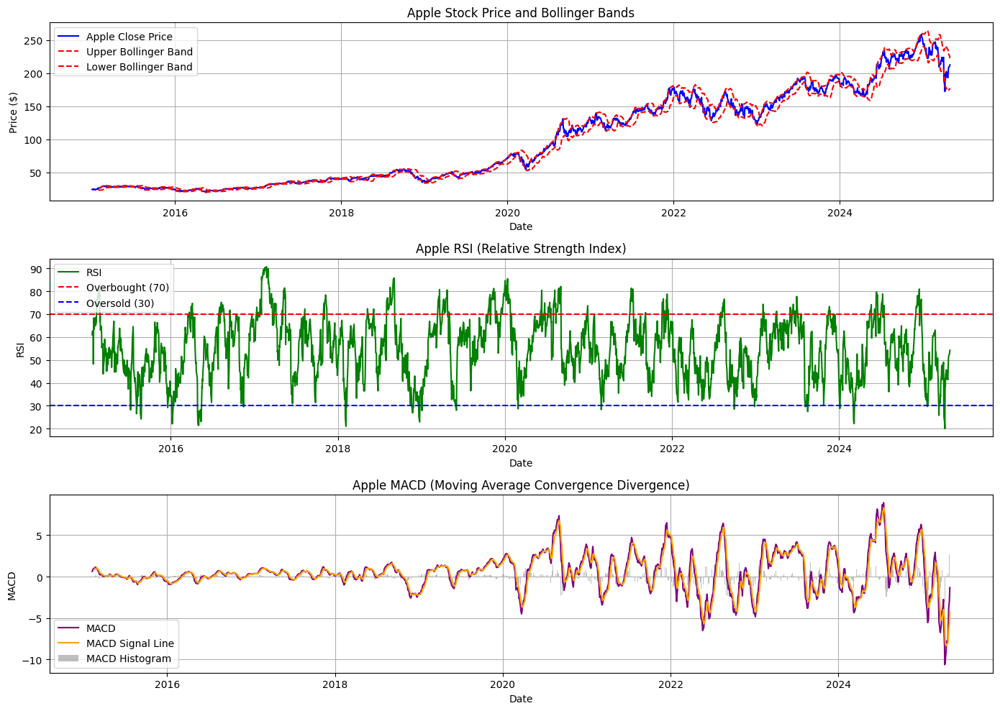

In [37]:
import matplotlib.pyplot as plt
import pandas as pd
from ta.momentum import RSIIndicator
from ta.trend import MACD
from ta.volatility import BollingerBands



print("Available stock symbols:")
for idx, symbol in enumerate(company_names.keys(), 1):
    print(f"{idx}. {company_names[symbol]} ({symbol})")

choice = int(input(f"Enter the number corresponding to the stock symbol you want to analyze (1-{len(company_names)}): "))
stock_symbol = list(company_names.keys())[choice - 1]
company_name = company_names[stock_symbol]

# Load the CSV data
csv_data = pd.read_csv(r'/home/kamin/Documents/CPE 232 Project/stock_sector_data.csv')


csv_data['Date'] = pd.to_datetime(csv_data['Date'])

stock_data = csv_data[csv_data['Symbol'] == stock_symbol]

# Calculate the RSI (14 days by default)
rsi = RSIIndicator(stock_data['Close'])
stock_data['RSI'] = rsi.rsi()

# Calculate the MACD (12, 26, 9)
macd = MACD(stock_data['Close'])
stock_data['MACD'] = macd.macd()
stock_data['MACD_signal'] = macd.macd_signal()

# Calculate Bollinger Bands (default 20-period, 2 standard deviations)
bollinger = BollingerBands(stock_data['Close'])
stock_data['Bollinger_Upper'] = bollinger.bollinger_hband()
stock_data['Bollinger_Lower'] = bollinger.bollinger_lband()

# Plot the stock price and indicators
plt.figure(figsize=(14, 10))

# Price plot with Bollinger Bands
plt.subplot(3, 1, 1)
plt.plot(stock_data['Date'], stock_data['Close'], label=f'{company_name} Close Price', color='blue')
plt.plot(stock_data['Date'], stock_data['Bollinger_Upper'], label='Upper Bollinger Band', linestyle='--', color='red')
plt.plot(stock_data['Date'], stock_data['Bollinger_Lower'], label='Lower Bollinger Band', linestyle='--', color='red')
plt.title(f'{company_name} Stock Price and Bollinger Bands')
plt.xlabel('Date')
plt.ylabel('Price ($)')
plt.legend()
plt.grid(True)

# RSI plot
plt.subplot(3, 1, 2)
plt.plot(stock_data['Date'], stock_data['RSI'], label='RSI', color='green')
plt.axhline(70, linestyle='--', color='red', label='Overbought (70)')
plt.axhline(30, linestyle='--', color='blue', label='Oversold (30)')
plt.title(f'{company_name} RSI (Relative Strength Index)')
plt.xlabel('Date')
plt.ylabel('RSI')
plt.legend()
plt.grid(True)

# MACD plot
plt.subplot(3, 1, 3)
plt.plot(stock_data['Date'], stock_data['MACD'], label='MACD', color='purple')
plt.plot(stock_data['Date'], stock_data['MACD_signal'], label='MACD Signal Line', color='orange')
plt.bar(stock_data['Date'], stock_data['MACD'] - stock_data['MACD_signal'], label='MACD Histogram', color='gray', alpha=0.5)
plt.title(f'{company_name} MACD (Moving Average Convergence Divergence)')
plt.xlabel('Date')
plt.ylabel('MACD')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


### Correlation Matrix (Heatmap)

Available stock symbols:
1. Apple (AAPL)
2. Microsoft (MSFT)
3. Amazon (AMZN)
4. Netflix (NFLX)
5. Moderna (MRNA)
6. Johnson & Johnson (JNJ)
7. Illumina (ILMN)
8. NextEra Energy (NEE)
9. Tesla (TSLA)
10. First Solar (FSLR)
11. S&P 500 (^GSPC)


/tmp/ipykernel_253638/3703163497.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stock_data['Returns'] = stock_data['Close'].pct_change()


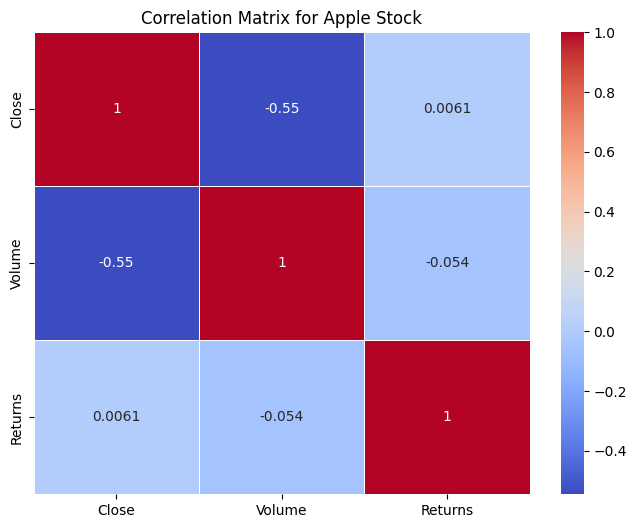

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd



print("Available stock symbols:")
for idx, symbol in enumerate(company_names.keys(), 1):
    print(f"{idx}. {company_names[symbol]} ({symbol})")

choice = int(input(f"Enter the number corresponding to the stock symbol you want to analyze (1-{len(company_names)}): "))
stock_symbol = list(company_names.keys())[choice - 1]
company_name = company_names[stock_symbol]

# Load the CSV data
csv_data = pd.read_csv(r'/home/kamin/Documents/CPE 232 Project/stock_sector_data.csv')


csv_data['Date'] = pd.to_datetime(csv_data['Date'])

stock_data = csv_data[csv_data['Symbol'] == stock_symbol]

stock_data['Returns'] = stock_data['Close'].pct_change()

# Get correlation matrix for selected stock
correlation_matrix = stock_data[['Close', 'Volume', 'Returns']].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title(f'Correlation Matrix for {company_name} Stock')
plt.show()


In [55]:
latest_dates = labeled_df.groupby('Symbol')['Date'].max().reset_index()
latest_dates.rename(columns={'Date': 'Latest_Date'}, inplace=True)
print(latest_dates)

# Select the last week's data from labeled_df
last_week_data = labeled_df.iloc[-1:]

# Use the selected features for prediction
X_last_week = last_week_data[select_features]

# Predict using the trained model
last_week_predictions = loaded_model.predict(X_last_week)

# Add predictions to the last_week_data DataFrame
last_week_data['Prediction'] = last_week_predictions

# Filter stocks that are predicted to outperform
outperforming_stocks = last_week_data[last_week_data['Prediction'] == 0]

print("Stocks predicted to outperform in the next week:")
print(outperforming_stocks[['Symbol', 'Date', 'Close', 'Prediction']])

  Symbol Latest_Date
0   AAPL  2025-04-21
Stocks predicted to outperform in the next week:
     Symbol       Date       Close  Prediction
2240   AAPL 2025-04-21  192.907028           0


/tmp/ipykernel_253638/614261887.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  last_week_data['Prediction'] = last_week_predictions
